# Проект: "Восстановление золота из руды"

<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Подготовка-данных" data-toc-modified-id="Подготовка-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Подготовка данных</a></span></li><li><span><a href="#Анализ-данных" data-toc-modified-id="Анализ-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Анализ данных</a></span></li><li><span><a href="#Модель" data-toc-modified-id="Модель-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Модель</a></span></li></ul></div>

# Основная информация о проекте

**Задача проекта** - смоделировать процесс восстановления золота из золотосодержащей руды.   
Прежде всего необходимо ознакомиться с **технологическим процессом получения золота из руды**:  

<div>
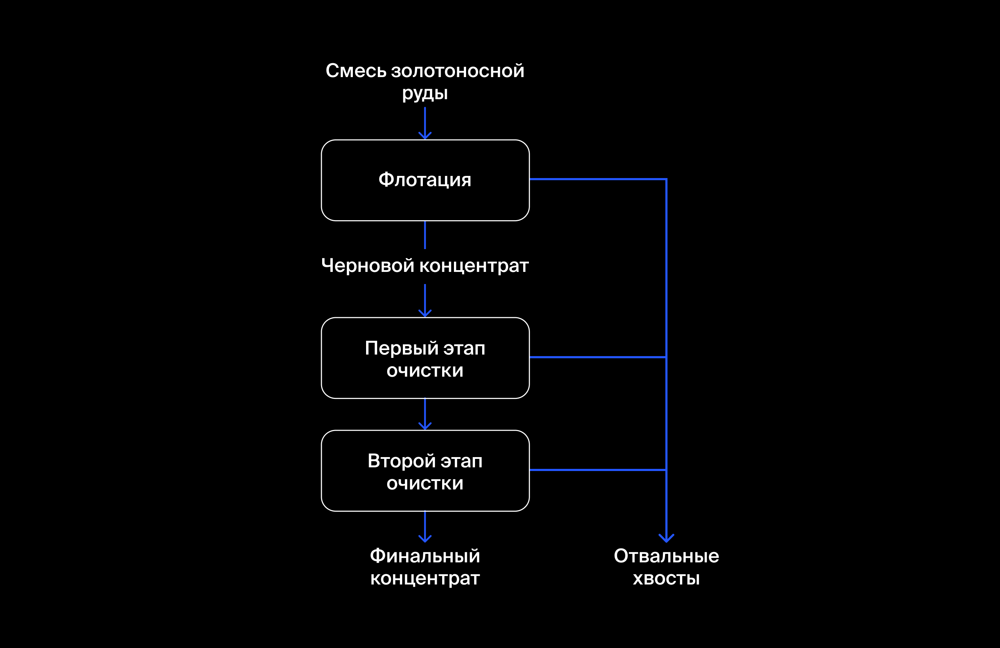
</div>


**Наименование признаков**

Наименование признаков должно быть такое:  
`[этап].[тип_параметра].[название_параметра]`

Возможные значения для блока `[этап]`:
- rougher — флотация
- primary_cleaner — первичная очистка
- secondary_cleaner — вторичная очистка
- final — финальные характеристики  

Возможные значения для блока `[тип_параметра]`:
- input — параметры сырья
- output — параметры продукта
- state — параметры, характеризующие текущее состояние этапа
- calculation — расчётные характеристики

Построенная модель **должна прогнозировать** следующие величины:
1. эффективность обогащения чернового концентрата `rougher.output.recovery`;
2. эффективность обогащения финального концентрата `final.output.recovery`.

**Эффективность обогащения** рассчитывается по формуле:

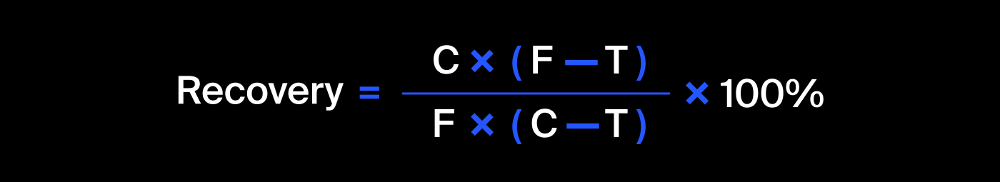

где:

- C — доля золота в концентрате после флотации/очистки;
- F — доля золота в сырье/концентрате до флотации/очистки;
- T — доля золота в отвальных хвостах после флотации/очистки.  
 
Для прогноза коэффициента нужно найти долю золота в концентратах и хвостах. Причём важен не только финальный продукт, но и черновой концентрат.

Оценку качества модели произведем на основе метрики **sMAPE** (англ. Symmetric Mean Absolute Percentage Error, «симметричное среднее абсолютное процентное отклонение»).  
**Итоговая метрика** складывается из двух прогнозируемых величин:

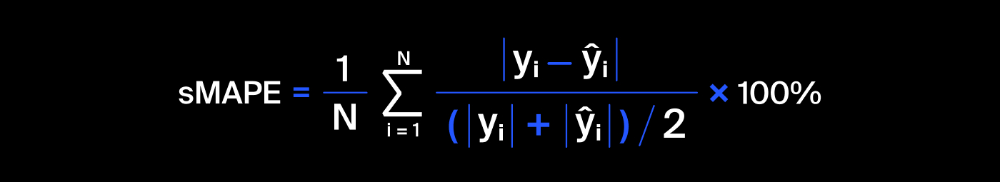

Проект выполнен в несколько **этапов**:
1. Подготовка данных;
2. Исследовательский анализ данных (EDA);
3. Построение и обучение модели.

In [1]:
#импортируем библиотеки

import pandas as pd
import numpy as np

import plotly.figure_factory as ff

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Lasso
from sklearn.metrics import make_scorer
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import cross_val_score

## Подготовка данных

In [2]:
df_train = pd.read_csv("/datasets/gold_recovery_train.csv")
df_test = pd.read_csv("/datasets/gold_recovery_test.csv")
df_full = pd.read_csv("/datasets/gold_recovery_full.csv")

**Проверка объема данных.** Проверим обучающую и тестовую выборки на наличие необходимых целевых переменных, а также убедимся в том, что в обучающей выборке имеются такие же фичи, что и в тестовой.

In [3]:
display(df_train.head(3))

if "rougher.output.recovery" in df_train.columns:
    print("Целевая переменная номер 1 на месте")
else:
    print("Целевой переменная номер 1 нет в данных")       

if "final.output.recovery" in df_train.columns:
    print("Целевая переменная номер 2 на месте")
else:
    print("Целевой переменная номер 2 нет в данных")     
        
print(df_train.shape)

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2,2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363


Целевая переменная номер 1 на месте
Целевая переменная номер 2 на месте
(16860, 87)


In [4]:
display(df_test.head(3))
        
if "rougher.output.recovery" in df_test.columns:
    print("Целевая переменная номер 1 на месте")
else:
    print("Целевой переменная номер 1 нет в данных")       

if "final.output.recovery" in df_test.columns:
    print("Целевая переменная номер 2 на месте")
else:
    print("Целевой переменная номер 2 нет в данных")     
        
print(df_test.shape)

,date,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-09-01 00:59:59,210.800909,14.993118,8.080000,1.005021,1398.981301,-500.225577,1399.144926,-499.919735,1400.102998,...,12.023554,-497.795834,8.016656,-501.289139,7.946562,-432.317850,4.872511,-500.037437,26.705889,-499.709414
1,2016-09-01 01:59:59,215.392455,14.987471,8.080000,0.990469,1398.777912,-500.057435,1398.055362,-499.778182,1396.151033,...,12.058140,-498.695773,8.130979,-499.634209,7.958270,-525.839648,4.878850,-500.162375,25.019940,-499.819438
2,2016-09-01 02:59:59,215.259946,12.884934,7.786667,0.996043,1398.493666,-500.868360,1398.860436,-499.764529,1398.075709,...,11.962366,-498.767484,8.096893,-500.827423,8.071056,-500.801673,4.905125,-499.828510,24.994862,-500.622559


Целевой переменная номер 1 нет в данных
Целевой переменная номер 2 нет в данных
(5856, 53)


Видим, что в тестовой выборке меньше фичей, чем в обучающей, а также нет целевых переменных.  
Добавим в тестовую выборку целевые переменные из общего датафрейма `df_full`, а затем удалим из обучающей выборки ненужные фичи.

Немного о способе добавления целевых переменных переменных. Предположим, что восстановление золота из руды происходит на одной установке, которая позволяет обрабатывать руду одну за другой. Если это так, что в общем датафрейме `df_full` не должно быть дубликатов в столбце `date`. Проверим данную гипотезу.

In [5]:
df_full["date"].duplicated().sum()

0

Видим, что дубликатов нет, поэтому применим метод `merge` и добавим целевые переменные на основе столбика `date`.

In [6]:
df_to_merge = df_full.loc[:,["date", "rougher.output.recovery", "final.output.recovery"]]

df_test = df_test.merge(df_to_merge, on = "date", how = "left")

if "rougher.output.recovery" in df_test.columns:
    print("Целевая переменная номер 1 на месте")
else:
    print("Целевой переменная номер 1 нет в данных")       

if "final.output.recovery" in df_test.columns:
    print("Целевая переменная номер 2 на месте")
else:
    print("Целевой переменная номер 2 нет в данных")     
        
print(df_test.shape)

Целевая переменная номер 1 на месте
Целевая переменная номер 2 на месте
(5856, 55)


Проверим, какие фичи не были включены в тестовую выборку.

In [7]:
set(df_train.columns)-set(df_test.columns)

{'final.output.concentrate_ag',
 'final.output.concentrate_au',
 'final.output.concentrate_pb',
 'final.output.concentrate_sol',
 'final.output.tail_ag',
 'final.output.tail_au',
 'final.output.tail_pb',
 'final.output.tail_sol',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.concentrate_au',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_sol',
 'primary_cleaner.output.tail_ag',
 'primary_cleaner.output.tail_au',
 'primary_cleaner.output.tail_pb',
 'primary_cleaner.output.tail_sol',
 'rougher.calculation.au_pb_ratio',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'rougher.calculation.sulfate_to_au_concentrate',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_au',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_sol',
 'rougher.output.tail_ag',
 'rougher.output.tail_au',
 'rougher.output.tail_pb',
 'rougher.output.tail_sol',
 'secondary_cleane

Таким образом, в тестовую выборку не включались `параметры продуктов: output` на каждом этапе, а также расчетные характеристики. Это вполне логично, т.к. целевых переменных у нас 2, поэтому остальные параметры продуктов типа хвостов или концентратов нас не интересуют. Относительно расчетных характеристик - их исключают, чтобы не стать жертвой мультиколлинеарности признаков.

**Проверка правильности расчета целевых переменных.** Прежде чем удалять ненужные фичи, самостоятельно рассчитаем целевые переменные по представленной выше формуле для расчета эффективности обогащения и убедимся, что значения совпадают с теми, которые предоставил нам Клиент.

In [8]:
def mae_recovery(C, F, T, true_rec):
                 
    """Функция для расчета MAE между самостоятельными расчетами эффективности обогащения
    и клиентскими показателями"""
    
    pred_rec = pd.Series(C*(F-T)/(F*(C-T))*100, name = "prediction")
    df_mae = pd.DataFrame(true_rec).join(pred_rec).dropna()
                 
    return mean_absolute_error(df_mae.iloc[:,0], df_mae.iloc[:,1])

In [9]:
print(mae_recovery(df_train["rougher.output.concentrate_au"],
                   df_train["rougher.input.feed_au"],
                   df_train["rougher.output.tail_au"],
                   df_train["rougher.output.recovery"]))

print(mae_recovery(df_train["final.output.concentrate_au"],
                   df_train["rougher.input.feed_au"],
                   df_train["final.output.tail_au"],
                   df_train["final.output.recovery"]))

9.444891926100695e-15
8.158251945945868e-15


Абсолютные отклонения между клиентскими данными и нашими расчетами очень незначительны и близки к 0. Таким образом, считаем расчет целевых переменных корректным и продолжаем обработку данных.

Теперь удалим ненужные фичи.

In [10]:
needed_features = (df_train.columns)&(df_test.columns)

df_train_good_fetures = df_train.loc[:, needed_features]

df_train_good_fetures.shape

(16860, 55)

**Обработка пропусков в целевых переменных.** Учитывая специфику проекта, можно предположить, что оставлять или же заполнять пропуски в целевых переменных нецелесообразно, т.к. ни обучение, ни тестирование на таких данных не несет никакой ценности. Таким образом, очистим выборки от пропусков в целевых переменных. Пропуски в фичах тоже дропнем.

In [11]:
df_train_final = df_train_good_fetures.dropna()
df_test_final = df_test.dropna()

print("Обучающая выборка сократилась на {:.0%}.".format(-(len(df_train_final)/len(df_train_good_fetures)-1)))
print("Обучающая выборка сократилась на {:.0%}.".format(-(len(df_test_final)/len(df_test)-1)))

Обучающая выборка сократилась на 25%.
Обучающая выборка сократилась на 11%.


После удаления пропусков объем выборок существенно сократился. Тем не менее, в данном проекте это единственный логичный способ обработки пропусков.

**Исследование мультиколлинеарности признаков**. Исследование мультиколлинеарности необходимо для избежания переобучения модели, а также сокращения времени ее обучения. Две переменных коллинеарны, когда они находятся между собой в линейной зависимости, если коэффициент корреляции более 0,7. Чтобы избавиться от мультиколлинарности, необходимо исключить из модели один из факторов. Например, в эконометрике исключается фактор, который при сильной связи с результатом имеет наибольшую тесноту связи с другими переменными.  

In [12]:
correlation = df_train_final.corr()

bad_features_rowlist = []

for index in correlation.index:
    for column in correlation.columns:
        if correlation.loc[index, column] >= 0.7 and correlation.loc[index, column] != 1:
            bad_features_rowlist.append((index, column, correlation.loc[index, column]))
                       
corr_info = (pd.DataFrame(bad_features_rowlist, columns=["x", "y", "correlation"]).drop_duplicates(subset="correlation")
                                                                                  .reset_index(drop=True))
    
corr_info

,x,y,correlation
0,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_b_air,0.945660
1,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_c_air,0.932462
2,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_level,0.977880
3,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_c_level,0.961629
4,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_d_level,0.738742
5,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_c_air,0.943610
6,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_level,0.967932
7,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_d_level,0.738511
8,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_level,0.726294
9,rougher.input.feed_ag,rougher.input.feed_au,0.848462


В нашем случае ни одна из переменных не имеет сильную связь с целевой переменной, поэтому удалим те фичи, которые имеют **несколько сильных взаимосвязей** с другими фичами.

In [13]:
drop_features = []

for index, row in enumerate(corr_info["x"].duplicated()):
    if row:
        drop_features.append(corr_info["x"][index])
        
#список переменных к удалению
drop_features

['primary_cleaner.state.floatbank8_a_air',
 'primary_cleaner.state.floatbank8_a_level',
 'primary_cleaner.state.floatbank8_a_level',
 'primary_cleaner.state.floatbank8_b_level',
 'rougher.state.floatbank10_b_air',
 'rougher.state.floatbank10_b_air',
 'rougher.state.floatbank10_b_air',
 'rougher.state.floatbank10_b_level',
 'rougher.state.floatbank10_b_level',
 'rougher.state.floatbank10_b_level',
 'rougher.state.floatbank10_c_air',
 'rougher.state.floatbank10_c_air',
 'rougher.state.floatbank10_c_level',
 'rougher.state.floatbank10_c_level',
 'rougher.state.floatbank10_d_air',
 'rougher.state.floatbank10_d_level',
 'secondary_cleaner.state.floatbank3_a_air',
 'secondary_cleaner.state.floatbank3_a_air',
 'secondary_cleaner.state.floatbank4_a_air',
 'secondary_cleaner.state.floatbank4_a_air',
 'secondary_cleaner.state.floatbank4_a_level',
 'secondary_cleaner.state.floatbank4_a_level',
 'secondary_cleaner.state.floatbank4_b_air']

In [14]:
df_train_final = df_train_final.drop(drop_features, axis = 1)
df_test_final = df_test_final.drop(drop_features, axis = 1)

df_train_final.shape, df_test_final.shape

((12679, 42), (5229, 42))

Работа над мультиколлинеарностью привела к сокращению количества признаков от 55 до 42.

**Таким образом, обработка данных завершена в несколько этапов:**
1. Тестовая выборка дополнена целевыми переменными;
2. Из обучающей выборки удалены те фичи, которых нет в тестовой, в том числе аргументирован данный подход;
3. Из обеих выборок исключены наблюдения с пропусками в целевых переменных фичах;
4. Проведена проверка правильности расчета целевых переменных. Абсолютное отклонение от клиентских данных близко к 0;
5. Исследована мультиколлинеарность признаков. В результате количество признаков сократилось на 13.

## Анализ данных

**2.1 Анализ концентрация металлов**  

Посмотрим, как меняется концентрация металлов (Au, Ag, Pb) на различных этапах очистки на тестовой и обучающей выборках.

In [15]:
def mean_concentrate_change(metal_name):
    
    """Функция для расчета среднего изменения концентрации металлов на различных этапах очистки"""
    
    rougher = "rougher.output.concentrate_" + metal_name
    primary = "primary_cleaner.output.concentrate_" + metal_name
    secondary = "final.output.concentrate_" + metal_name
    
    print("Среднее изменение концентрации металла {} на этапе первоначальной очистки составило {:.2f}%".format(metal_name,
                                                                        (df_full[primary] - df_full[rougher]).mean()))
    
    print("Среднее изменение концентрации металла {} на этапе вторичной очистки составило {:.2f}%".format(metal_name,
                                                                        (df_full[secondary] - df_full[primary]).mean()))
    

In [16]:
mean_concentrate_change("au")

Среднее изменение концентрации металла au на этапе первоначальной очистки составило 11.33%
Среднее изменение концентрации металла au на этапе вторичной очистки составило 10.80%


In [17]:
mean_concentrate_change("ag")

Среднее изменение концентрации металла ag на этапе первоначальной очистки составило -3.18%
Среднее изменение концентрации металла ag на этапе вторичной очистки составило -2.91%


In [18]:
mean_concentrate_change("pb")

Среднее изменение концентрации металла pb на этапе первоначальной очистки составило 2.01%
Среднее изменение концентрации металла pb на этапе вторичной очистки составило 0.24%


Эффективный процесс восстановления золота из руды сопровождается увеличением концентрации золота после каждого этапа очистки. Согласно расчетам, концентрация золота на этапе первоначальной очистки в среднем увеличивается на 11.33%, а на этапе вторичной очистки - на 10.8%. При этом конецентрация серебра сокращается,а концентрация свинца несущественно увеличивается.

**2.2. Распределение размеров гранул сырья на обучающей и тестовой выборках.**  

Сравним распределения размеров гранул сырья на обучающей и тестовой выборках. Если распределения сильно отличаются друг от друга, оценка модели будет неправильной.

In [19]:
#данные для гистограммы
hist_data = [df_train_final["rougher.input.feed_size"].dropna(), df_test_final["rougher.input.feed_size"].dropna()]

group_labels = ['train_feed_size', 'test_feed_size']

#формируем гистограммы
fig = ff.create_distplot(hist_data, group_labels, bin_size=[.1, .25])
fig.show()

Согласно построенной гистограмме, распределение гранул сырья на обучающей и тестовой выборках примерно одинаковое. Это говорит об однородности данных и о том, что обучение и тестирование моделей можно провести с достаточной точностью.

**2.3. Суммарная концентрацию всех веществ на разных стадиях**  

Исследуем суммарную концентрацию всех веществ на разных стадиях: в сырье, в черновом и финальном концентратах. 

In [20]:
def total_concentrate(stage):
    au = stage + ".output.concentrate_au"
    ag = stage + ".output.concentrate_ag"
    pb = stage + ".output.concentrate_ag"
    return df_full[au]+df_full[ag]+df_full[pb]

feed_concentrate = total_concentrate("rougher")
cleaner_concentrate = total_concentrate("primary_cleaner")
final_concentrate = total_concentrate("final")

#данные для гистограммы
hist_data = [feed_concentrate.dropna(), cleaner_concentrate.dropna(), final_concentrate.dropna()]

group_labels = ['feed', 'cleaner', 'final']

#формируем гистограммы
fig = ff.create_distplot(hist_data, group_labels, bin_size=[.1, .25, .1])
fig.show()

В распределении концентрации металлов есть аномалии, но удалять мы их не будем, т.к. модель должна быть приближенной к реальности. Реальность такова, что технологический процесс всегда подвержен аномалимям.

## Модель

**3.1. Функция для вычисления итоговой sMAPE.**

In [21]:
def sMAPE_total(rougher, final):
    return 0.25 * rougher + 0.75 * final

def sMAPE(target, prediction):
    return (abs(target-prediction)/((abs(target)+abs(prediction))/2)*100).mean()

**3.2. Выбор модели.**  

Обучим разные модели и оценим их качество кросс-валидацией. Выберем лучшую модель и проверим её на тестовой выборке. 

Для начала определим фичи для прогнозирования rougher и final. Для процесса rougher выберем фичи с приставкой rougher, для final - все остальное.

In [22]:
#фичи и таргеты для прогнозирования и теста rougher

features_rougher_list = []
for feature_rougher in df_train_final.columns:
    if "rougher" in feature_rougher and "rougher.output" not in feature_rougher:
        features_rougher_list.append(feature_rougher)
    
features_rougher_train = df_train_final.loc[:, features_rougher_list]
target_rougher_train = df_train_final["rougher.output.recovery"]

features_rougher_test = df_test_final.loc[:, features_rougher_list]
target_rougher_test = df_test_final["rougher.output.recovery"]

features_rougher_list

['rougher.input.feed_ag',
 'rougher.input.feed_pb',
 'rougher.input.feed_rate',
 'rougher.input.feed_size',
 'rougher.input.feed_sol',
 'rougher.input.feed_au',
 'rougher.input.floatbank10_sulfate',
 'rougher.input.floatbank10_xanthate',
 'rougher.input.floatbank11_sulfate',
 'rougher.input.floatbank11_xanthate',
 'rougher.state.floatbank10_a_air',
 'rougher.state.floatbank10_a_level',
 'rougher.state.floatbank10_e_air',
 'rougher.state.floatbank10_e_level',
 'rougher.state.floatbank10_f_air',
 'rougher.state.floatbank10_f_level']

In [23]:
#фичи и таргеты для прогнозирования и теста final

features_final_list = []
for feature_final in df_train_final.columns:
    if "rougher" not in feature_final and "final.output" not in feature_final and "date" not in feature_final:
        features_final_list.append(feature_final)
    
features_final_train = df_train_final.loc[:, features_final_list]
target_final_train = df_train_final["final.output.recovery"]

features_final_test = df_test_final.loc[:, features_final_list]
target_final_test = df_test_final["final.output.recovery"]

features_final_list

['primary_cleaner.input.sulfate',
 'primary_cleaner.input.depressant',
 'primary_cleaner.input.feed_size',
 'primary_cleaner.input.xanthate',
 'primary_cleaner.state.floatbank8_b_air',
 'primary_cleaner.state.floatbank8_c_air',
 'primary_cleaner.state.floatbank8_c_level',
 'primary_cleaner.state.floatbank8_d_air',
 'primary_cleaner.state.floatbank8_d_level',
 'secondary_cleaner.state.floatbank2_a_air',
 'secondary_cleaner.state.floatbank2_a_level',
 'secondary_cleaner.state.floatbank2_b_air',
 'secondary_cleaner.state.floatbank2_b_level',
 'secondary_cleaner.state.floatbank3_a_level',
 'secondary_cleaner.state.floatbank3_b_air',
 'secondary_cleaner.state.floatbank3_b_level',
 'secondary_cleaner.state.floatbank4_b_level',
 'secondary_cleaner.state.floatbank5_a_air',
 'secondary_cleaner.state.floatbank5_a_level',
 'secondary_cleaner.state.floatbank5_b_air',
 'secondary_cleaner.state.floatbank5_b_level',
 'secondary_cleaner.state.floatbank6_a_air',
 'secondary_cleaner.state.floatbank6_a_l

In [24]:
#проверим, что учли все поля
#2 - количество целевых переменных
#1 - столбик с датой

len(features_final_train.columns) + len(features_rougher_train.columns) + 2 + 1 == len(df_train_final.columns)

True

Перейдем к обучению моделей. Начнем с линейной регрессии и модели Лассо.

In [25]:
def prediction(model,features_rougher_train, target_rougher_train, features_final_train, target_final_train, cv):
    # предиктим rougher и считаем sMAPE
    sMAPE_rougher = cross_val_score(model, features_rougher_train, target_rougher_train,
                                    scoring = make_scorer(sMAPE, greater_is_better = False), cv=cv)
    
    # предиктим rougher
    sMAPE_final = cross_val_score(model, features_final_train, target_final_train,
                                    scoring = make_scorer(sMAPE, greater_is_better = False), cv=cv)

    sMAPE_cross = []
    for metric in range(len(sMAPE_rougher)):
        sMAPE_cross.append(sMAPE_total(sMAPE_rougher[metric], sMAPE_final[metric]))
    
    print("Средняя sMAPE в результате кросс-валидации составила {:.2f}%.".format(abs(pd.Series(sMAPE_cross).mean())))

In [26]:
prediction(LinearRegression(),features_rougher_train, target_rougher_train, features_final_train, target_final_train, 10)

Средняя sMAPE в результате кросс-валидации составила 9.46%.


In [27]:
prediction(Lasso(),features_rougher_train, target_rougher_train, features_final_train, target_final_train, 10)

Средняя sMAPE в результате кросс-валидации составила 9.37%.


In [28]:
prediction(KNeighborsRegressor(),features_rougher_train, target_rougher_train, features_final_train, target_final_train, 10)

Средняя sMAPE в результате кросс-валидации составила 11.81%.


На модели Лассо ключевая метрика показала лучший результат, однако, не совсем понятно, насколько хороша метрика равна 9.37%. Чтобы убедиться в адекватности модели сравним ее результаты с результатами модели, которая предсказывает медианные значения целевых переменных. В реальном мире невозможно восстанавливать из руды константное количество золота, поэтому в случае если метрика на констнатной модели будет ниже, чем по модели Лассо, то у нас возникнуть вопросы относильно адекватности предоставленных данных либо относительно нашего понимания технологическогог процесса.

In [29]:
median_prediction_rougher = pd.Series(df_train_final["rougher.output.recovery"].median(), index=target_rougher_test.index)
median_prediction_final = pd.Series(df_train_final["final.output.recovery"].median(), index=target_final_test.index)

sMAPE_rougher_dummy = sMAPE(median_prediction_rougher, target_rougher_test)
sMAPE_final_dummy = sMAPE(median_prediction_final, target_final_test)

sMAPE_total(sMAPE_rougher_dummy, sMAPE_final_dummy)

9.079458241653288

Метрика по константной модели составила 9.1%, что меньше, чем мы получили по модели Лассо. Возможно, что это совпадение, а возможно, в производстве использовалось примерно одинаковое сырье. Можно было бы провести анализ статистических гипотез, однако, отклонение достаточно низкое, поэтому остановимся на том, что модель Лассо подходит для проверки на тестовой выборке.

Проверим уровень sMAPE на **тестовой** выборке по лучшей модели.

In [30]:
model = Lasso()
prediction_rougher = model.fit(features_rougher_train, target_rougher_train).predict(features_rougher_test)
sMAPE_rougher = sMAPE(target_rougher_test, prediction_rougher)

prediction_final = model.fit(features_final_train, target_final_train).predict(features_final_test)
sMAPE_final = sMAPE(target_final_test, prediction_final)

sMAPE_total(sMAPE_rougher, sMAPE_final)

9.20228367251559

Метрика уменьшилась на тестовой выборке на 0.17 процентных пунктов. Учитывая специфику проекта (множество выбросов при технологическом процессе), уровень метрики 9.2% является приемлемым, поэтому остановимся на модели Лассо.